In [1]:
import os
import matplotlib.pyplot as plt
import numpy as np
import tensorflow
import pandas as pd
import albumentations
import cv2

import keras
import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import *
from tensorflow.keras.callbacks import ModelCheckpoint


/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
print(tf.__version__)
print(keras.__version__)
!nvidia-smi

2.12.0
2.12.0
Wed Nov  1 10:38:33 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.161.03   Driver Version: 470.161.03   CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   30C    P0    25W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                          

# Metrics

In [3]:
#intersection over union
def iou(y_true, y_pred, smooth = 0.5):
    intersection = K.sum(y_true * y_pred)
    sum_ = K.sum(y_true + y_pred)
    jac = (intersection + smooth) / (sum_ - intersection + smooth)
    return jac


# Computing Sensitivity      
def sensitivity(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    return true_positives / (possible_positives + K.epsilon())

# Computing Specificity
def specificity(y_true, y_pred):
    true_negatives = K.sum(K.round(K.clip((1-y_true) * (1-y_pred), 0, 1)))
    possible_negatives = K.sum(K.round(K.clip(1-y_true, 0, 1)))
    return true_negatives / (possible_negatives + K.epsilon())

def f1_score(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    recall = true_positives / (possible_positives + K.epsilon())
    f1_val = 2*(precision*recall)/(precision+recall+K.epsilon())
    return f1_val

# Define Dice coefficient metric
def dice_coefficient(y_true, y_pred, epsilon=1e-6):
    y_true_flat = tf.reshape(y_true, [-1])
    y_pred_flat = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true_flat * y_pred_flat)
    dice_score = (2.0 * intersection + epsilon) / (tf.reduce_sum(y_true_flat) + tf.reduce_sum(y_pred_flat) + epsilon)
    return dice_score
def tversky(y_true, y_pred, smooth=1, alpha=0.7):
    y_true_pos = K.flatten(y_true)
    y_pred_pos = K.flatten(y_pred)
    true_pos = K.sum(y_true_pos * y_pred_pos)
    false_neg = K.sum(y_true_pos * (1 - y_pred_pos))
    false_pos = K.sum((1 - y_true_pos) * y_pred_pos)
    return (true_pos + smooth) / (true_pos + alpha * false_neg + (1 - alpha) * false_pos + smooth)

def tversky_loss(y_true, y_pred):
    return 1 - tversky(y_true, y_pred)

def focal_tversky_loss(y_true, y_pred, gamma=0.75):
    tv = tversky(y_true, y_pred)
    return K.pow((1 - tv), gamma)#intersection over union
def iou(y_true, y_pred, smooth = 0.5):
    intersection = K.sum(y_true * y_pred)
    sum_ = K.sum(y_true + y_pred)
    jac = (intersection + smooth) / (sum_ - intersection + smooth)
    return jac


# Computing Sensitivity      
def sensitivity(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    return true_positives / (possible_positives + K.epsilon())

# Computing Specificity
def specificity(y_true, y_pred):
    true_negatives = K.sum(K.round(K.clip((1-y_true) * (1-y_pred), 0, 1)))
    possible_negatives = K.sum(K.round(K.clip(1-y_true, 0, 1)))
    return true_negatives / (possible_negatives + K.epsilon())

def f1_score(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    recall = true_positives / (possible_positives + K.epsilon())
    f1_val = 2*(precision*recall)/(precision+recall+K.epsilon())
    return f1_val

# Define Dice coefficient metric
def dice_coefficient(y_true, y_pred, epsilon=1e-6):
    y_true_flat = tf.reshape(y_true, [-1])
    y_pred_flat = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true_flat * y_pred_flat)
    dice_score = (2.0 * intersection + epsilon) / (tf.reduce_sum(y_true_flat) + tf.reduce_sum(y_pred_flat) + epsilon)
    return dice_score

def tversky(y_true, y_pred, smooth=1, alpha=0.7):
    y_true_pos = K.flatten(y_true)
    y_pred_pos = K.flatten(y_pred)
    true_pos = K.sum(y_true_pos * y_pred_pos)
    false_neg = K.sum(y_true_pos * (1 - y_pred_pos))
    false_pos = K.sum((1 - y_true_pos) * y_pred_pos)
    return (true_pos + smooth) / (true_pos + alpha * false_neg + (1 - alpha) * false_pos + smooth)

def tversky_loss(y_true, y_pred):
    return 1 - tversky(y_true, y_pred)

def focal_tversky_loss(y_true, y_pred, gamma=0.75):
    tv = tversky(y_true, y_pred)
    return K.pow((1 - tv), gamma)

# CallBacks

In [4]:
epochs = 10

earlystop = keras.callbacks.EarlyStopping(monitor='val_loss',
                          min_delta=0,
                          patience=epochs,
                          verbose=1,
                          restore_best_weights=True
                          )

reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor='val_loss',
                              factor=0.2,
                              patience=5,
                              verbose=1,
                              min_delta=0.0001)
csv_logger = keras.callbacks.CSVLogger('Model.log')


callbacks = [earlystop, csv_logger, reduce_lr]

In [5]:
prefix = '/kaggle/input/covid-segmentation/'

images_radiopedia = np.load(os.path.join(prefix, 'images_radiopedia.npy')).astype(np.float32)
masks_radiopedia = np.load(os.path.join(prefix, 'masks_radiopedia.npy')).astype(np.int8)
images_medseg = np.load(os.path.join(prefix, 'images_medseg.npy')).astype(np.float32)
masks_medseg = np.load(os.path.join(prefix, 'masks_medseg.npy')).astype(np.int8)

test_images_medseg = np.load(os.path.join(prefix, 'test_images_medseg.npy')).astype(np.float32)

In [6]:
def visualize(image_batch, mask_batch=None, pred_batch=None, num_samples = 8):
    num_classes = mask_batch.shape[-1] if mask_batch is not None else 0
    fix, ax = plt.subplots(num_classes + 1, num_samples, figsize=(num_samples * 2, (num_classes + 1) * 2))

    for i in range(num_samples):
        ax_image = ax[0, i] if num_classes > 0 else ax[i]
        ax_image.imshow(image_batch[i,:,:,0], cmap='Greys')
        ax_image.set_xticks([]) 
        ax_image.set_yticks([])
        
        if mask_batch is not None:
            for j in range(num_classes):
                if pred_batch is None:
                    mask_to_show = mask_batch[i,:,:,j]
                else:
                    mask_to_show = np.zeros(shape=(*mask_batch.shape[1:-1], 3)) 
                    mask_to_show[..., 0] = pred_batch[i,:,:,j] > 0.5
                    mask_to_show[..., 1] = mask_batch[i,:,:,j]
                ax[j + 1, i].imshow(mask_to_show, vmin=0, vmax=1)
                ax[j + 1, i].set_xticks([]) 
                ax[j + 1, i].set_yticks([]) 

    plt.tight_layout()
    plt.show()

In [7]:
def plot_hists(images1, images2=None):
    plt.hist(images1.ravel(), bins=100, density=True, color='b', alpha=1 if images2 is None else 0.5)
    if images2 is not None:
        plt.hist(images2.ravel(), bins=100, density=True, alpha=0.5, color='orange')
    plt.show();

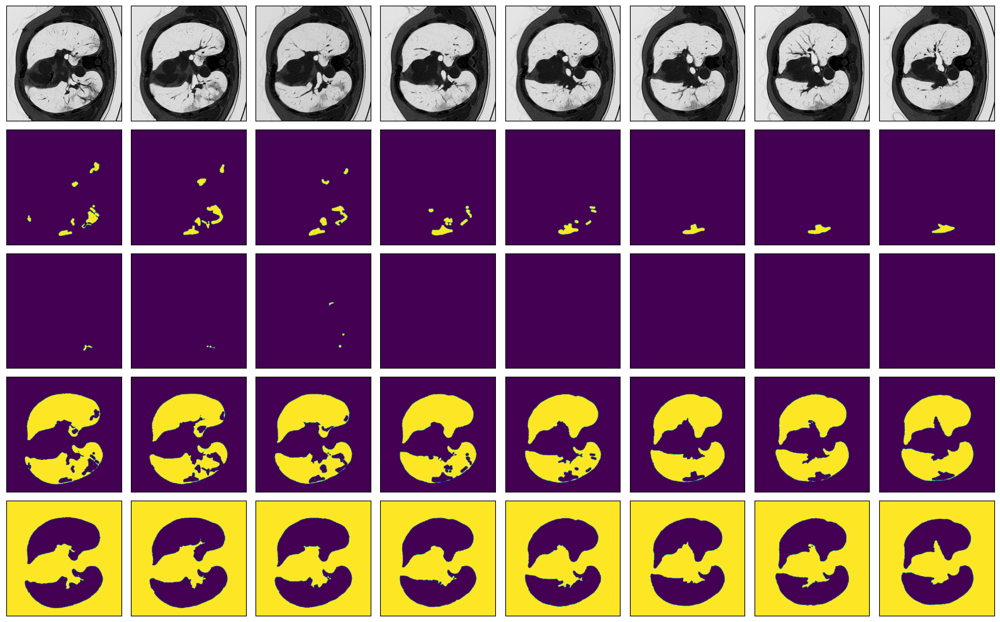

In [8]:
visualize(images_radiopedia[30:], masks_radiopedia[30:])

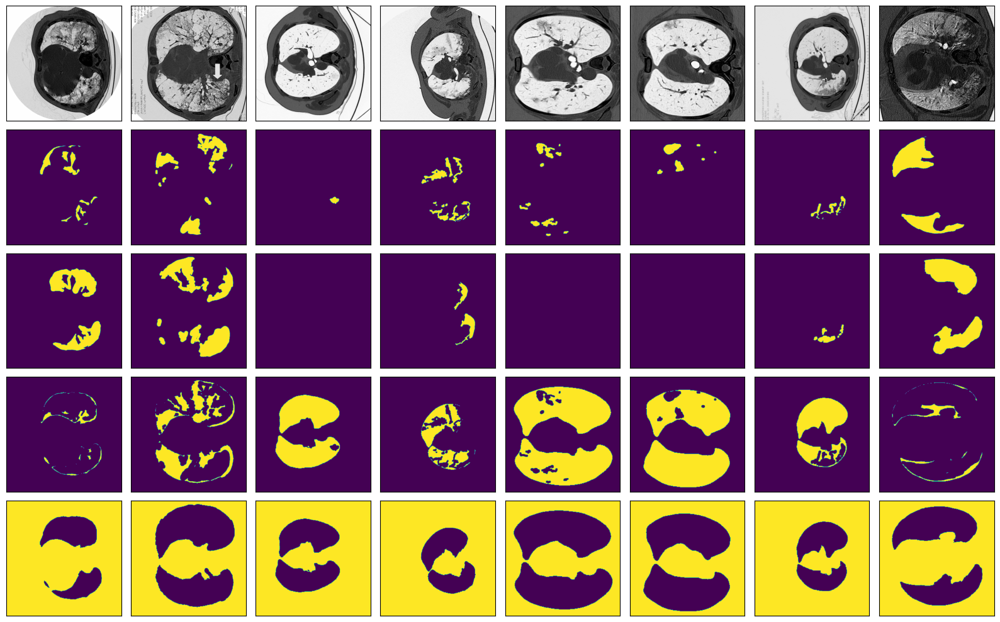

In [9]:
visualize(images_medseg, masks_medseg)

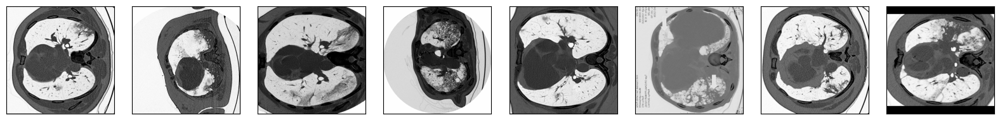

In [10]:
visualize(test_images_medseg)

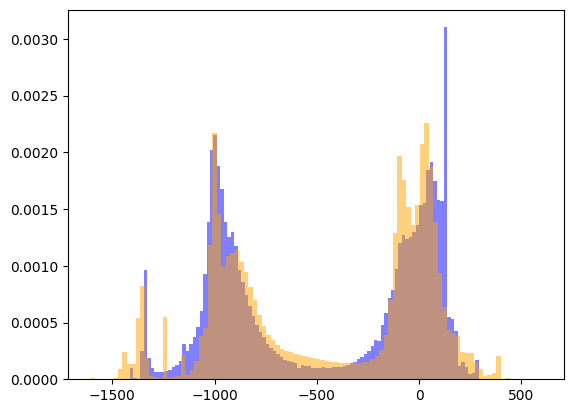

In [11]:
plot_hists(images_radiopedia, images_medseg)

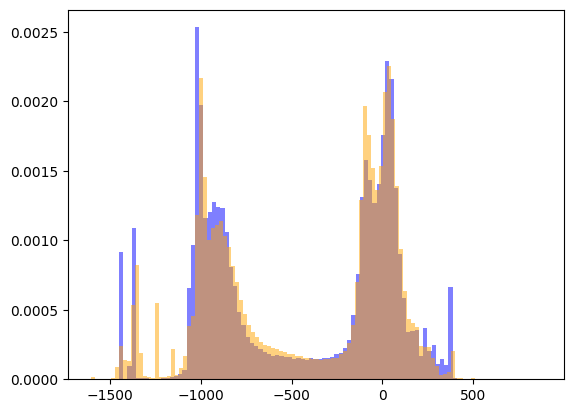

In [12]:
plot_hists(test_images_medseg, images_medseg)

In [13]:
def preprocess_images(images_arr, mean_std=None):
    images_arr[images_arr > 500] = 500
    images_arr[images_arr < -1500] = -1500
    min_perc, max_perc = np.percentile(images_arr, 5), np.percentile(images_arr, 95)
    images_arr_valid = images_arr[(images_arr > min_perc) & (images_arr < max_perc)]
    mean, std = (images_arr_valid.mean(), images_arr_valid.std()) if mean_std is None else mean_std
    images_arr = (images_arr - mean) / std
    print(f'mean {mean}, std {std}')
    return images_arr, (mean, std)

images_radiopedia, mean_std = preprocess_images(images_radiopedia)
images_medseg, _ = preprocess_images(images_medseg, mean_std)
test_images_medseg, _ = preprocess_images(test_images_medseg, mean_std)

mean -451.6488342285156, std 458.5679016113281
mean -451.6488342285156, std 458.5679016113281
mean -451.6488342285156, std 458.5679016113281


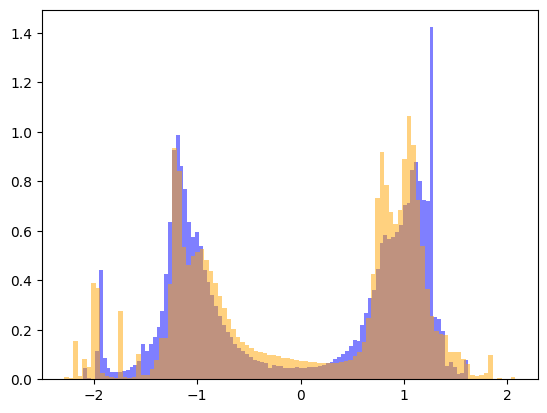

In [14]:
plot_hists(images_radiopedia, images_medseg)

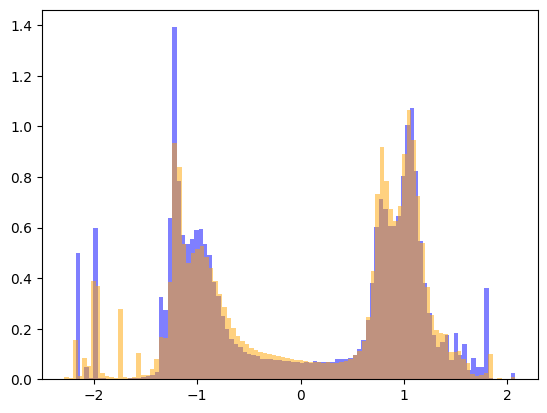

In [15]:
plot_hists(test_images_medseg, images_medseg)

In [16]:
val_indexes, train_indexes = list(range(24)), list(range(24, 100))

train_images = np.concatenate((images_medseg[train_indexes], images_radiopedia))
train_masks = np.concatenate((masks_medseg[train_indexes], masks_radiopedia))
val_images = images_medseg[val_indexes]
val_masks = masks_medseg[val_indexes]

batch_size = len(val_masks)

In [17]:
SOURCE_SIZE = 512
TARGET_SIZE = 224

train_augs = albumentations.Compose([
    albumentations.Rotate(limit=360, p=0.9, border_mode = cv2.BORDER_REPLICATE),
    albumentations.RandomSizedCrop((int(SOURCE_SIZE * 0.75), SOURCE_SIZE), 
                                   TARGET_SIZE, 
                                   TARGET_SIZE, 
                                   interpolation = cv2.INTER_NEAREST),
    albumentations.HorizontalFlip(p=0.5),

])

val_augs = albumentations.Compose([
    albumentations.Resize(TARGET_SIZE, TARGET_SIZE, interpolation = cv2.INTER_NEAREST)
])

In [18]:
class Dataset:   
    def __init__(
            self, 
            images, 
            masks,
            augmentations=None
    ):
        self.images = images
        self.masks = masks
        self.augmentations = augmentations
    
    def __getitem__(self, i):
        image = self.images[i]
        mask = self.masks[i]
        
        if self.augmentations:
            sample = self.augmentations(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']
        return image, mask
        
    def __len__(self):
        return len(self.images)
    
    
class Dataloder(tensorflow.keras.utils.Sequence):
    
    def __init__(self, dataset, batch_size=1, shuffle=False):
        self.dataset = dataset
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.indexes = np.arange(len(dataset))

        self.on_epoch_end()

    def __getitem__(self, i):
        
        # collect batch data
        start = i * self.batch_size
        stop = (i + 1) * self.batch_size
        images = []
        masks = []
        for j in range(start, stop):
            image, mask = self.dataset[self.indexes[j]]
            images.append(image)
            masks.append(mask)
        
        images = np.stack(images, axis=0)
        masks = np.stack(masks, axis=0).astype(np.float32)
        
        return (images, masks)
    
    def __len__(self):
        """Denotes the number of batches per epoch"""
        return len(self.indexes) // self.batch_size
    
    def on_epoch_end(self):
        """Callback function to shuffle indexes each epoch"""
        if self.shuffle:
            self.indexes = np.random.permutation(self.indexes)
            
train_dataset = Dataset(train_images, train_masks, train_augs)
val_dataset = Dataset(val_images, val_masks, val_augs)

train_dataloader = Dataloder(train_dataset, batch_size = batch_size, shuffle = True)
val_dataloader = Dataloder(val_dataset, batch_size = batch_size, shuffle = False)

In [19]:
len(train_dataset)

905

In [20]:
assert train_dataloader[0][0].shape == (batch_size, TARGET_SIZE, TARGET_SIZE, 1)
assert train_dataloader[0][1].shape == (batch_size, TARGET_SIZE, TARGET_SIZE, 4)

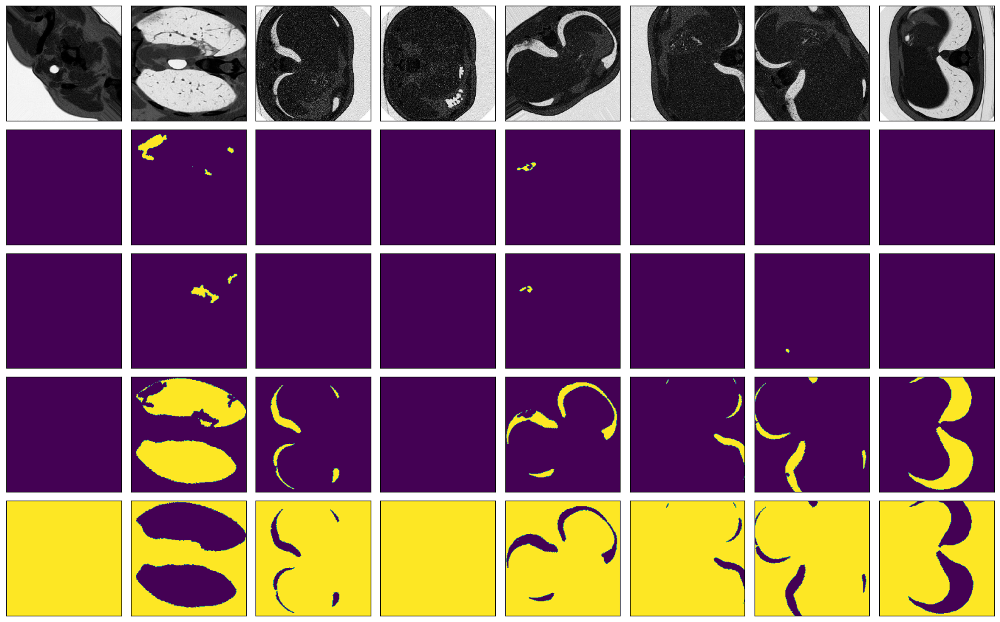

In [21]:
visualize(*next(iter(train_dataloader)))

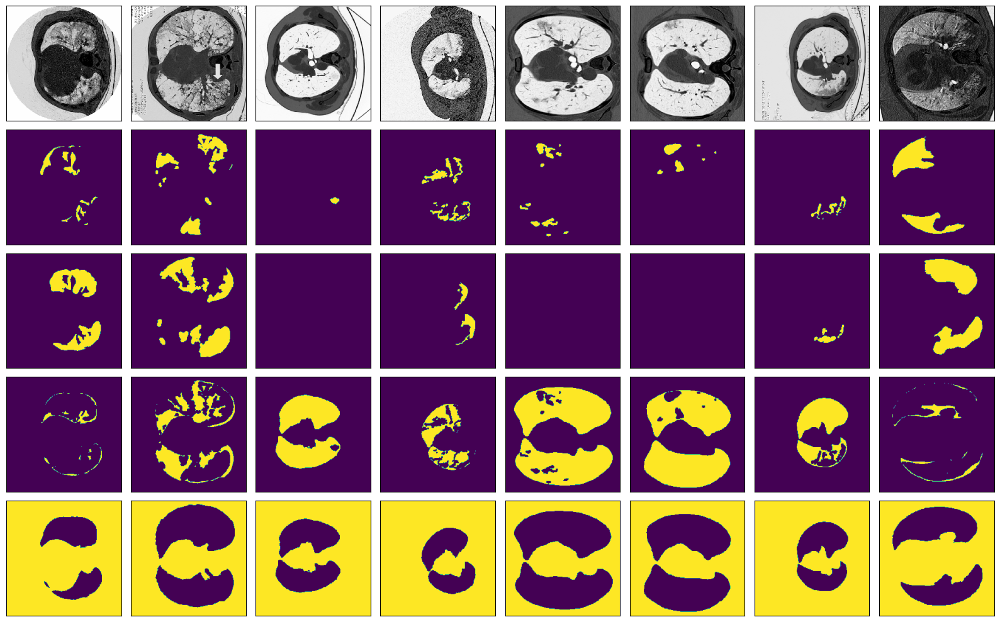

In [22]:
visualize(*next(iter(val_dataloader)))

In [23]:
#from keras.layers.advanced_activations import ELU
from keras.layers import ELU, PReLU, LeakyReLU
from tensorflow.keras import Model
from tensorflow.keras.layers import Input, Conv2D, Concatenate, MaxPooling2D, Conv2DTranspose
from keras.applications import NASNetMobile

In [24]:
strategy = tf.distribute.MirroredStrategy()
print('Number of devices: {}'.format(strategy.num_replicas_in_sync))

Number of devices: 1


# EluNEt with NasNetMobile as Encoder

In [25]:
#from keras.layers.advanced_activations import ELU
from keras.layers import ELU, PReLU, LeakyReLU

In [26]:
def conv_block(input_tensor, num_filters, kernel_size):
    
    x = tf.keras.layers.Conv2D(num_filters, kernel_size, padding='same')(input_tensor)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Activation('ELU')(x)
    
    x = tf.keras.layers.Conv2D(num_filters, kernel_size, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Activation('ELU')(x)
    
    return x

def unetpp_nasnet(input_shape, num_classes, kernel_size):
    nasnet_model = NASNetMobile(include_top=False, input_shape=input_shape, weights=None)

    nasnet_output = nasnet_model.output

    # Decoder
    up1 = tf.keras.layers.UpSampling2D((2, 2))(nasnet_output)
    conv4 = conv_block(up1, 256, kernel_size)

    up2 = tf.keras.layers.UpSampling2D((2, 2))(conv4)
    conv5 = conv_block(up2, 128, kernel_size)

    up3 = tf.keras.layers.UpSampling2D((2, 2))(conv5)
    conv6 = conv_block(up3, 64, kernel_size)

    up4 = tf.keras.layers.UpSampling2D((2, 2))(conv6)
    conv7 = conv_block(up4, 32, kernel_size)

    up_final = tf.keras.layers.UpSampling2D(size=(2, 2))(conv7)
    output = Conv2D(num_classes, (3, 3), activation='softmax', padding='same')(up_final)
    model = tf.keras.models.Model(inputs=nasnet_model.input, outputs=output)
    
    return model

In [27]:
with strategy.scope():
    model = unetpp_nasnet(input_shape=(224, 224, 1), num_classes=4, kernel_size=(3, 3))
    model.compile(loss = "categorical_crossentropy",
                optimizer = tf.keras.optimizers.Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07), 
                metrics = (['accuracy', tf.keras.metrics.Precision(name ='precision'),
                        tf.keras.metrics.Recall(name ='recall'),
                        tf.keras.metrics.AUC(name ='AUC'),
                        f1_score, specificity, sensitivity, iou, dice_coefficient, tversky]))

In [28]:
print(model.input_shape)
print(model.output_shape)
#model.summary()

(None, 224, 224, 1)
(None, 224, 224, 4)


In [ ]:
tf.keras.utils.plot_model(model, 
           to_file='model-Plot.png',
           show_shapes = True,
           show_dtype=True,
           show_layer_names = True,
           show_layer_activations=True,
           rankdir = 'TB', 
           expand_nested = False, 
           dpi = 96)

In [30]:
%%time
history = model.fit(
    train_dataloader,
    steps_per_epoch=len(train_dataloader) * 6,
    epochs = 10,
    validation_data = val_dataloader,
    validation_steps = len(val_dataloader),
    callbacks=callbacks,
    workers = 4)

222/222 [==============================] - 241s 305ms/step - loss: 0.2615 - accuracy: 0.9156 - precision: 0.9354 - recall: 0.8948 - AUC: 0.9877 - f1_score: 0.9073 - specificity: 0.9794 - sensitivity: 0.8948 - iou: 0.7689 - dice_coefficient: 0.8589 - tversky: 0.8589 - val_loss: 8.3809 - val_accuracy: 0.1546 - val_precision: 0.1480 - val_recall: 0.1442 - val_AUC: 0.3885 - val_f1_score: 0.1461 - val_specificity: 0.7232 - val_sensitivity: 0.1442 - val_iou: 0.0989 - val_dice_coefficient: 0.1800 - val_tversky: 0.1800 - lr: 0.0010
Epoch 2/10
222/222 [==============================] - 62s 277ms/step - loss: 0.1253 - accuracy: 0.9535 - precision: 0.9601 - recall: 0.9482 - AUC: 0.9968 - f1_score: 0.9541 - specificity: 0.9869 - sensitivity: 0.9482 - iou: 0.8745 - dice_coefficient: 0.9329 - tversky: 0.9329 - val_loss: 14.8898 - val_accuracy: 0.2231 - val_precision: 0.2223 - val_recall: 0.2203 - val_AUC: 0.4165 - val_f1_score: 0.2213 - val_specificity: 0.7431 - val_sensitivity: 0.2203 - val_iou: 0.

In [31]:
model.save("Model-NAS.h5")
print('Model save to Disk')

Model save to Disk


In [32]:
import pandas as pd
df = pd.DataFrame(history.history) 
df.to_excel("outputNas.xlsx")
#df.to_csv("output1.csv")
df.head(10)

,loss,accuracy,precision,recall,AUC,f1_score,specificity,sensitivity,iou,dice_coefficient,...,val_precision,val_recall,val_AUC,val_f1_score,val_specificity,val_sensitivity,val_iou,val_dice_coefficient,val_tversky,lr
0,0.261460,0.915564,0.935356,0.894782,0.987744,0.907274,0.979383,0.894782,0.768868,0.858907,...,0.148011,0.144235,0.388524,0.146098,0.723249,0.144235,0.098883,0.179970,0.179971,0.0010
1,0.125254,0.953466,0.960117,0.948192,0.996783,0.954099,0.986869,0.948192,0.874505,0.932899,...,0.222261,0.220260,0.416453,0.221256,0.743088,0.220260,0.117018,0.209519,0.209520,0.0010
2,0.103268,0.960507,0.965614,0.956436,0.997744,0.960993,0.988646,0.956436,0.894306,0.944120,...,0.189425,0.188731,0.370997,0.189077,0.730798,0.188731,0.091568,0.167773,0.167774,0.0010
3,0.090182,0.965209,0.969774,0.961528,0.998217,0.965624,0.990009,0.961528,0.905546,0.950355,...,0.210253,0.209527,0.415440,0.209889,0.737659,0.209527,0.116932,0.209380,0.209380,0.0010
4,0.080839,0.968361,0.972377,0.965234,0.998544,0.968784,0.990859,0.965234,0.914812,0.955443,...,0.224031,0.221239,0.422421,0.222626,0.744566,0.221239,0.119884,0.214100,0.214101,0.0010
5,0.073845,0.970872,0.974454,0.968094,0.998789,0.971256,0.991539,0.968094,0.920875,0.958747,...,0.274816,0.272593,0.491792,0.273700,0.760227,0.272593,0.158422,0.273513,0.273514,0.0010
6,0.063225,0.974983,0.978164,0.972476,0.999090,0.975307,0.992763,0.972476,0.930246,0.963815,...,0.414799,0.408700,0.619472,0.411727,0.807801,0.408700,0.255586,0.407118,0.407118,0.0002
7,0.060993,0.975776,0.978783,0.973441,0.999130,0.976099,0.992965,0.973441,0.933044,0.965312,...,0.528324,0.519555,0.717657,0.523903,0.845384,0.519555,0.350487,0.519052,0.519053,0.0002
8,0.059494,0.976305,0.979183,0.974038,0.999185,0.976600,0.993096,0.974038,0.934533,0.966119,...,0.677889,0.676785,0.855551,0.677336,0.892804,0.676785,0.511586,0.676887,0.676887,0.0002
9,0.058462,0.976689,0.979469,0.974480,0.999204,0.976963,0.993190,0.974481,0.935704,0.966739,...,0.740279,0.740117,0.890675,0.740198,0.913445,0.740117,0.581405,0.735301,0.735302,0.0002


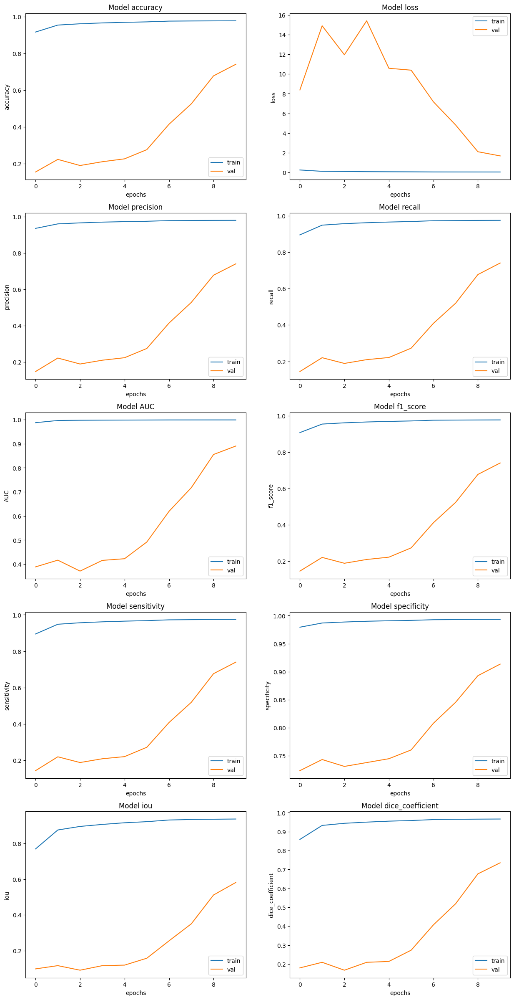

In [33]:
# Interpreting the Metrics
fig, ax = plt.subplots(5, 2, figsize=(15, 30))
ax = ax.ravel()

for i, met in enumerate(['accuracy', 'loss', 'precision', 'recall', 'AUC', 'f1_score','sensitivity', 'specificity','iou', 'dice_coefficient']):
    ax[i].plot(history.history[met])
    ax[i].plot(history.history['val_' + met])
    ax[i].set_title('Model {}'.format(met))
    ax[i].set_xlabel('epochs')
    ax[i].set_ylabel(met)
    ax[i].legend(['train', 'val'])
plt.savefig("Model-Results-NAS.png")

In [34]:
%%time
print("Evaluate on test data")
results = model.evaluate(val_dataloader, batch_size=16, callbacks= callbacks)
print("test loss test acc:", results)

Evaluate on test data
1/1 [==============================] - 0s 329ms/step - loss: 1.6893 - accuracy: 0.7402 - precision: 0.7403 - recall: 0.7401 - AUC: 0.8907 - f1_score: 0.7402 - specificity: 0.9134 - sensitivity: 0.7401 - iou: 0.5814 - dice_coefficient: 0.7353 - tversky: 0.7353
test loss test acc: [1.6893481016159058, 0.7402219176292419, 0.7402785420417786, 0.7401174902915955, 0.8906745314598083, 0.7401979565620422, 0.9134449362754822, 0.7401174902915955, 0.5814046859741211, 0.7353014945983887, 0.7353016138076782]
CPU times: user 383 ms, sys: 20.1 ms, total: 403 ms
Wall time: 420 ms


In [35]:
%%time
model = tf.keras.models.load_model('Model-NAS.h5',
                                           compile=False,
                                           custom_objects={
                                                'Accuracy': 'accuracy', 
                                                'Precision': tf.keras.metrics.Precision(), 
                                                'Recall': tf.keras.metrics.Recall()})

model.compile(Adam(learning_rate=0.001, amsgrad=True),
              loss = "categorical_crossentropy")

CPU times: user 7.29 s, sys: 183 ms, total: 7.48 s
Wall time: 7.34 s


In [36]:
def calculate_severity(mask):
    # Count the number of pixels in the mask
    total_pixels = mask.shape[0] * mask.shape[1]
    
    # Compute the percentage of infected pixels
    infected_pixels = np.count_nonzero(mask)
    severity_percentage = (infected_pixels / total_pixels) * 100
    
    return severity_percentage

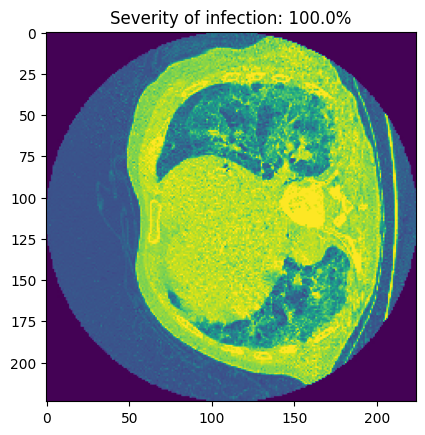

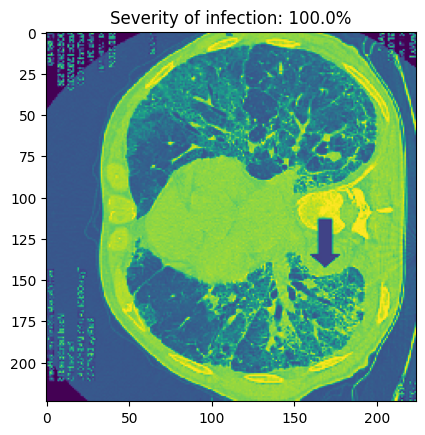

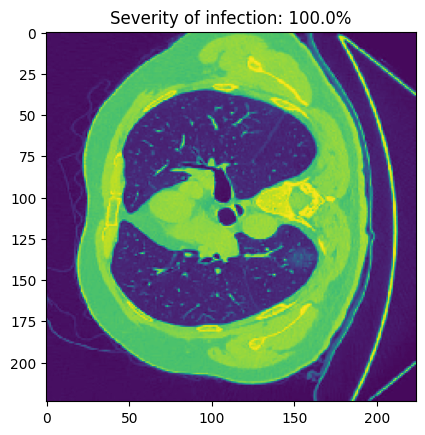

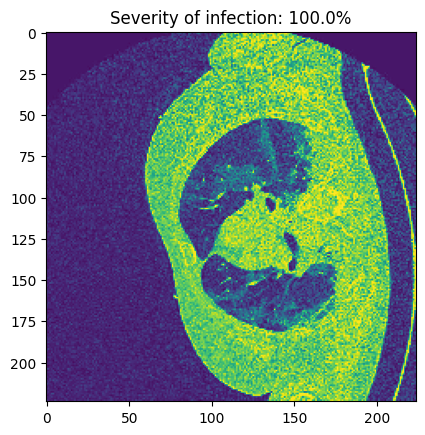

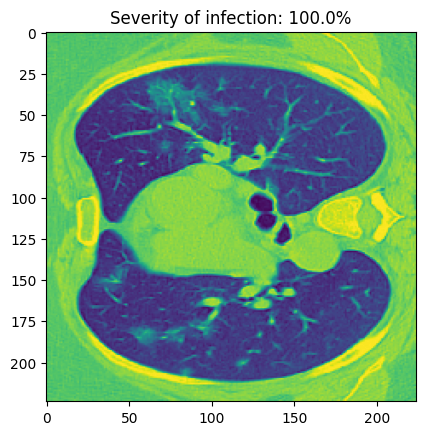

...

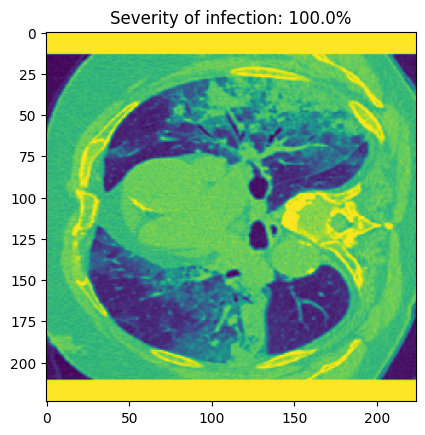

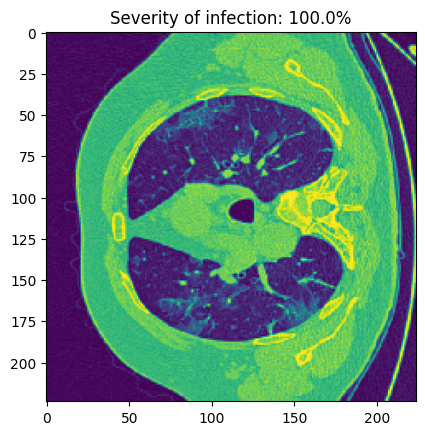

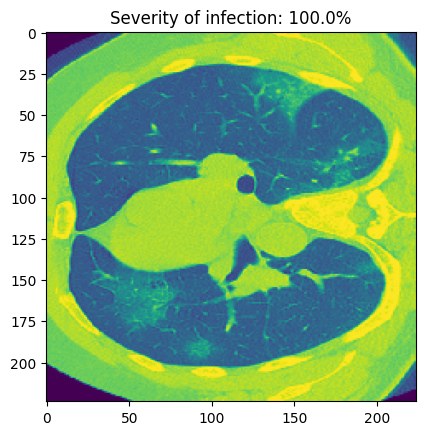

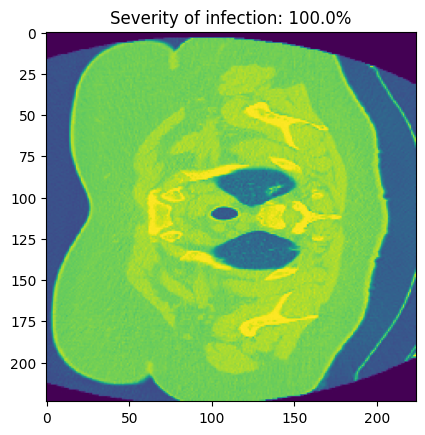

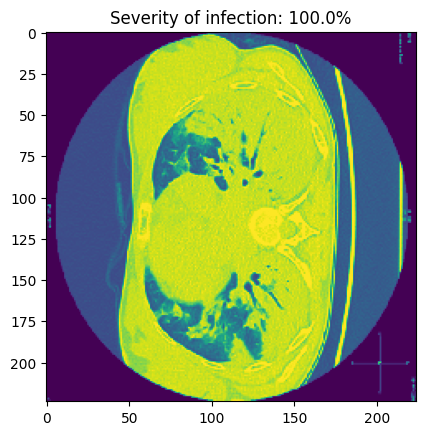

CPU times: user 13.1 s, sys: 3.91 s, total: 17 s
Wall time: 10.5 s


In [37]:
%%time
input = val_dataloader[0]
image_batch, mask_batch = input

preds = model.predict_on_batch(image_batch)
#visualize(image_batch, mask_batch, pred_batch=preds)

for i in range(len(preds)):
    # Get the i-th predicted mask and corresponding image from the batch
    pred_mask = preds[i]
    image = image_batch[i]
    
    # Convert the predicted mask to a binary image 
    pred_mask_binary = np.argmax(pred_mask, axis=-1).astype(np.uint8)
    
    # Calculate the severity percentage for the predicted mask
    severity_percentage = calculate_severity(pred_mask_binary)
    
    # Display the severity percentage and the corresponding image
    plt.imshow(image)
    plt.title(f"Severity of infection: {severity_percentage}%")
    plt.show()

Accuracy: 0.8682344397720025


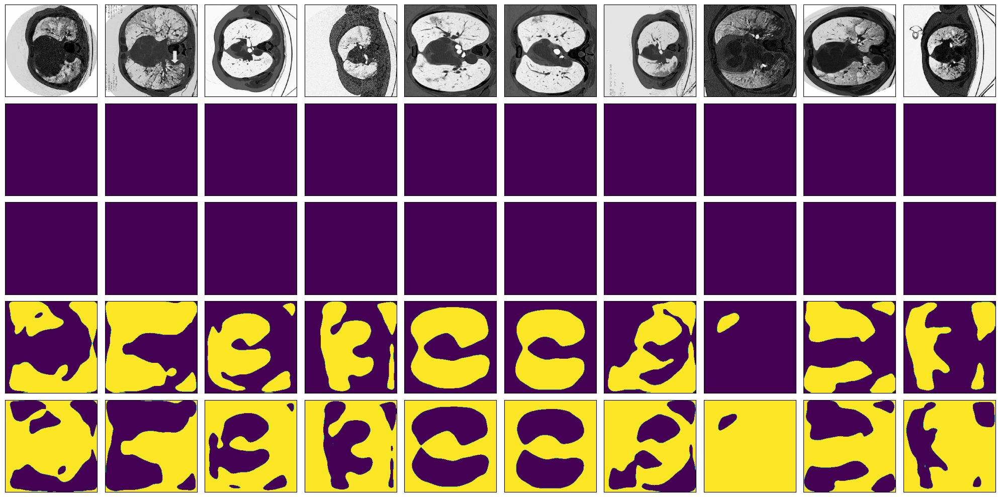

CPU times: user 15 s, sys: 516 ms, total: 15.5 s
Wall time: 14.8 s


In [38]:
%%time
model = tf.keras.models.load_model('Model-NAS.h5',
                                   compile=False)

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001, amsgrad=True),
              loss="categorical_crossentropy",
              metrics = (['accuracy', tf.keras.metrics.Precision(name='precision'),
                        tf.keras.metrics.MeanIoU(num_classes=4),
                        tf.keras.metrics.Recall(name='recall'),
                        tf.keras.metrics.AUC(name='AUC'),
                        specificity, sensitivity, iou, dice_coefficient,tversky]))

input = val_dataloader[0]
image_batch, mask_batch = input

preds = model.predict_on_batch(image_batch)

test_masks_prediction = preds > 0.3
# Calculate accuracy
accuracy = np.mean(test_masks_prediction == mask_batch)

# Print the accuracy score
print('Accuracy:', accuracy)
visualize(image_batch, test_masks_prediction, num_samples=len(test_images_medseg))

# Quantization

In [39]:
converter = tf.lite.TFLiteConverter.from_keras_model(model)
converter.optimizations = [tf.lite.Optimize.DEFAULT]
tflite_quant_model = converter.convert()

open("converted_quant_model.tflite", "wb").write(tflite_quant_model)

8611928

In [40]:
print("Float model in Mb:", os.path.getsize('converted_quant_model.tflite') / float(2**20))
print("Quantized model in Mb:", os.path.getsize('converted_quant_model.tflite') / float(2**20))
print("Compression ratio:", os.path.getsize('converted_quant_model.tflite')/os.path.getsize('converted_quant_model.tflite'))

Float model in Mb: 8.212974548339844
Quantized model in Mb: 8.212974548339844
Compression ratio: 1.0
